
# <p style="color:#f90c0c;text-align:center;font-family:rockwell;font-weight: bold;font-size:120%">Cassava Leaf Disease Classification 🌱✨ </p>



# Dataset

Link: https://www.kaggle.com/c/cassava-leaf-disease-classification/overview

---


 


# <p style="color:#f90c0c;text-align:center;font-family:rockwell;font-weight: bold;font-size:120%">Imports and setup Libraries</p>


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers,models
from sklearn.metrics import accuracy_score
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import EfficientNetB3
from tensorflow.keras import models, layers, optimizers
import warnings
warnings.simplefilter("ignore")
from PIL import Image
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau


 
# <p style="color:#f90c0c;text-align:center;font-family:rockwell;font-weight: bold;font-size:120%">Load Dataset </p>



In [2]:
import os
Dir = 'cassava-leaf-disease-classification'
os.listdir(Dir)

['label_num_to_disease_map.json',
 'sample_submission.csv',
 'test_images',
 'test_tfrecords',
 'train-pangkas.csv',
 'train.csv',
 'train_images',
 'train_tfrecords']

# <p style="color:#f90c0c;text-align:center;font-family:rockwell;font-weight: bold;font-size:120%">Descriptive </p>


In [3]:
# Menampilkan jumlah data train

print(len(os.listdir('cassava-leaf-disease-classification/train_images')))

21397


In [4]:
# Menampilkan jumlah data test

print(len(os.listdir('cassava-leaf-disease-classification/test_images')))

12


In [5]:
# baca data train.csv

train_df = pd.read_csv('cassava-leaf-disease-classification/train.csv')
train_df.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


<Axes: xlabel='label', ylabel='count'>

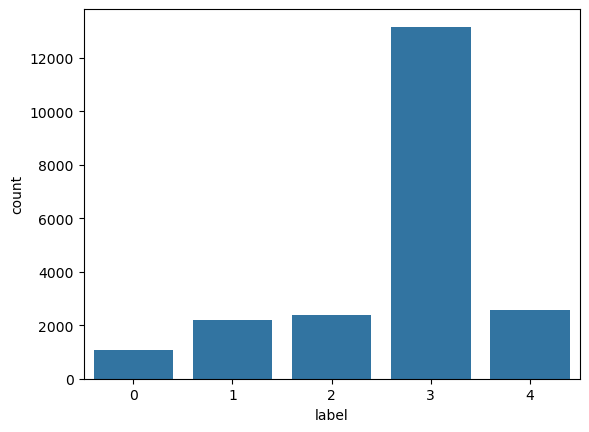

In [6]:
sns.countplot(train_df , x = 'label')

We can see that there is imbalance in the data as we have more images of 3 category.

In [7]:
train_df['label'].value_counts()

label
3    13158
4     2577
2     2386
1     2189
0     1087
Name: count, dtype: int64

In [9]:
# Warna tema Okabe Ito
okabe_ito_colors = ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2']

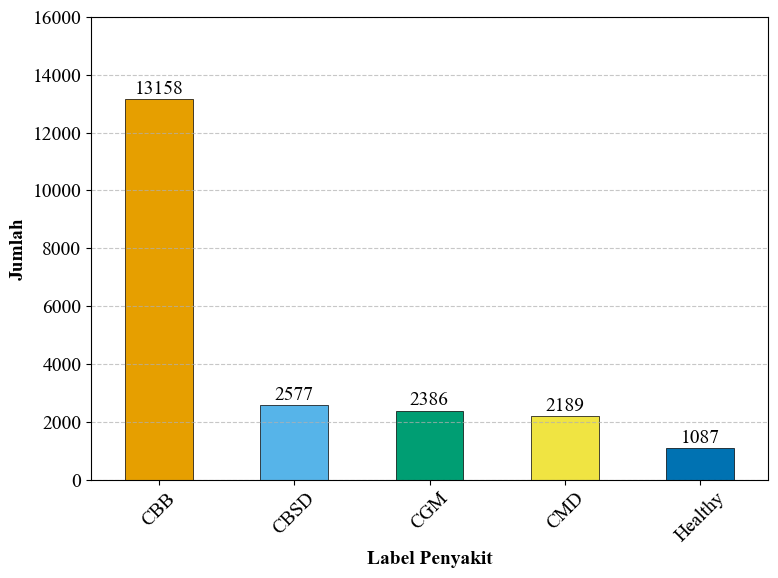

In [30]:
# Mengatur parameter font
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 14

# Membuat diagram batang
plt.figure(figsize=(8, 6), dpi=100)
label_counts.plot(kind='bar', color=okabe_ito_colors, edgecolor='black', linewidth=0.5)  # Menambahkan parameter linewidth
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Menambahkan judul dan label sumbu
#plt.title('Distribusi Label Penyakit Daun Singkong', fontweight='bold')
plt.xlabel('Label Penyakit', fontweight='bold')
plt.ylabel('Jumlah', fontweight='bold')

# Menambahkan nilai pada setiap batang
for i, v in enumerate(label_counts):
    plt.text(i, v + 50, str(v), ha='center', va='bottom', fontsize=14)

# Menampilkan grafik
new_label_names = {0: 'CBB', 1: 'CBSD', 2: 'CGM', 3: 'CMD', 4: 'Healthy'}
plt.xticks(ticks=range(len(new_label_names)), labels=new_label_names.values(), rotation=45)

# Mengatur batas atas dan bawah sumbu y
y_min = 0  # Parameter batas bawah
y_max = 16000  # Parameter batas atas
plt.ylim(y_min, y_max)

plt.tight_layout()
plt.show()

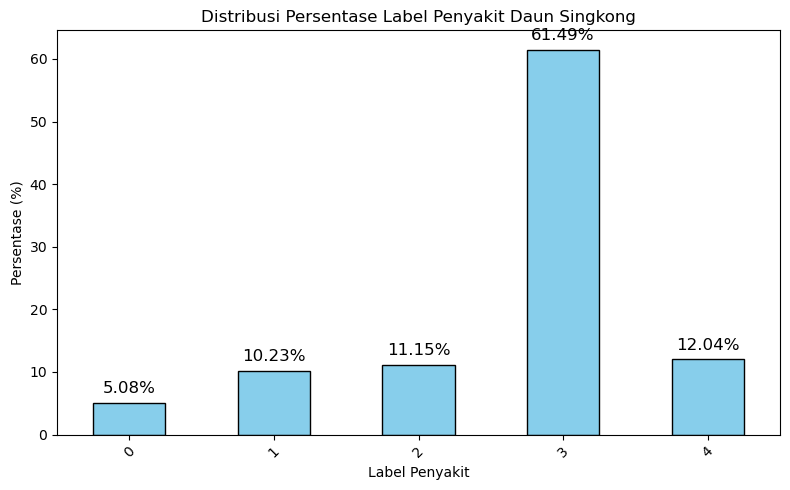

In [8]:
#np.round((train_df['label'].value_counts()/len(train_df['label']))*100, 2)

# Menghitung persentase distribusi label
label_counts = train_df['label'].value_counts()
label_percentages = np.round((label_counts / len(train_df['label'])) * 100, 2)

# Mengurutkan label berdasarkan persentase (opsional)
label_percentages = label_percentages.sort_index()

# Membuat grafik batang
plt.figure(figsize=(8, 5))
label_percentages.plot(kind='bar', color='skyblue', edgecolor='black')

# Menambahkan judul dan label sumbu
plt.title('Distribusi Persentase Label Penyakit Daun Singkong')
plt.xlabel('Label Penyakit')
plt.ylabel('Persentase (%)')

# Menambahkan nilai persentase di atas setiap batang
for i, v in enumerate(label_percentages):
    plt.text(i, v + 1, f'{v}%', ha='center', va='bottom', fontsize=12, color='black')

# Menampilkan grafik
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [143]:
len(train_df)

21397


# <p style="color:#f90c0c;text-align:center;font-family:rockwell;font-weight: bold;font-size:120%">Mapping of Cassava Diseases </p>


In [144]:
import json
with open('cassava-leaf-disease-classification/label_num_to_disease_map.json') as file:
    print(json.dumps(json.loads(file.read()), indent=4))

{
    "0": "Cassava Bacterial Blight (CBB)",
    "1": "Cassava Brown Streak Disease (CBSD)",
    "2": "Cassava Green Mottle (CGM)",
    "3": "Cassava Mosaic Disease (CMD)",
    "4": "Healthy"
}



<head>
  <title>Cassava Disease Classes</title>
  <style>
    table {
      width: 80%;
      border-collapse: collapse;
      margin: 20px 0;
    }

    th, td {
      border: 1px solid #dddddd;
      text-align: left;
      padding: 8px;
    }

    th {
      background-color: #2ecc71; /* Green color */
      color: white;
    }
  </style>
</head>

<body>

  <h2>Cassava Disease Classes</h2>

  <table>
    <tr>
      <th>Class Code</th>
      <th>Class Name</th>
      <th>Disease Name</th>
    </tr>
    <tr>
      <td>cbb</td>
      <td>Bacterial Blight</td>
      <td>Bacterial Blight Disease</td>
    </tr>
    <tr>
      <td>cbsd</td>
      <td>Brown Streak Disease</td>
      <td>Brown Streak Disease</td>
    </tr>
    <tr>
      <td>cgm</td>
      <td>Green Mite</td>
      <td>Green Mite Disease</td>
    </tr>
    <tr>
      <td>cmd</td>
      <td>Mosaic Disease</td>
      <td>Cassava Mosaic Disease</td>
    </tr>
    <tr>
      <td>healthy</td>
      <td>Healthy</td>
      <td>Healthy Cassava</td>
    </tr>
    <tr>
      <td>unknown</td>
      <td>Unknown</td>
      <td>Unknown Condition</td>
    </tr>
  </table>

</body>




# <p style="color:#f90c0c;text-align:center;font-family:rockwell;font-weight: bold;font-size:120%"> Exploratory Data Analysis </p>



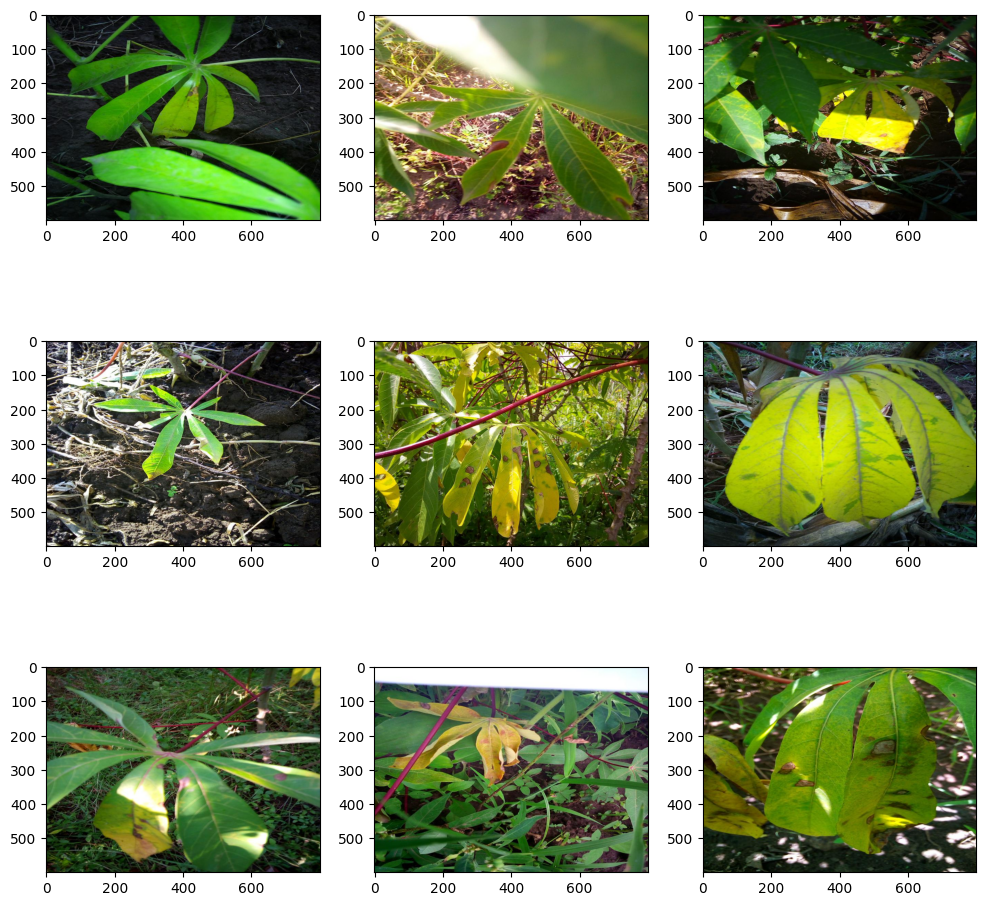

In [145]:
#"0": "Cassava Bacterial Blight (CBB)"

import cv2
sample = train_df[train_df.label == 0].sample(9)
plt.figure(figsize=(12,12))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(3, 3, ind + 1)
    image = cv2.imread(os.path.join("cassava-leaf-disease-classification/train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("on")
    
plt.show()

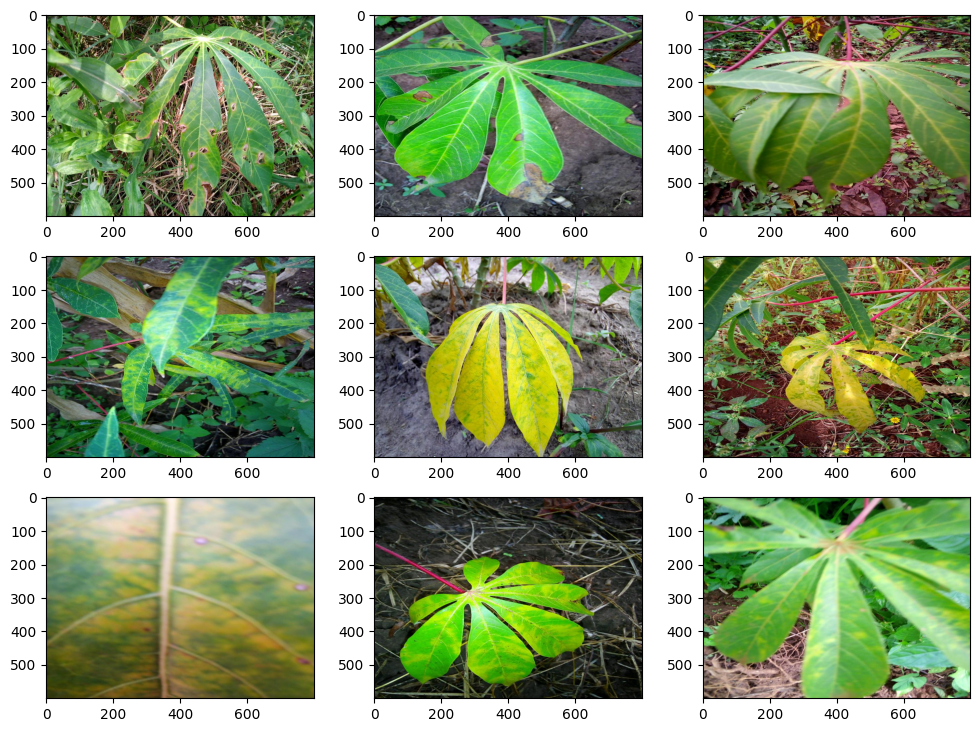

In [146]:
#"1": "Cassava Brown Streak Disease (CBSD)"

sample = train_df[train_df.label == 1].sample(9)
plt.figure(figsize=(12,12))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(4, 3, ind + 1)
    image = cv2.imread(os.path.join("cassava-leaf-disease-classification/train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("on")
    
plt.show()

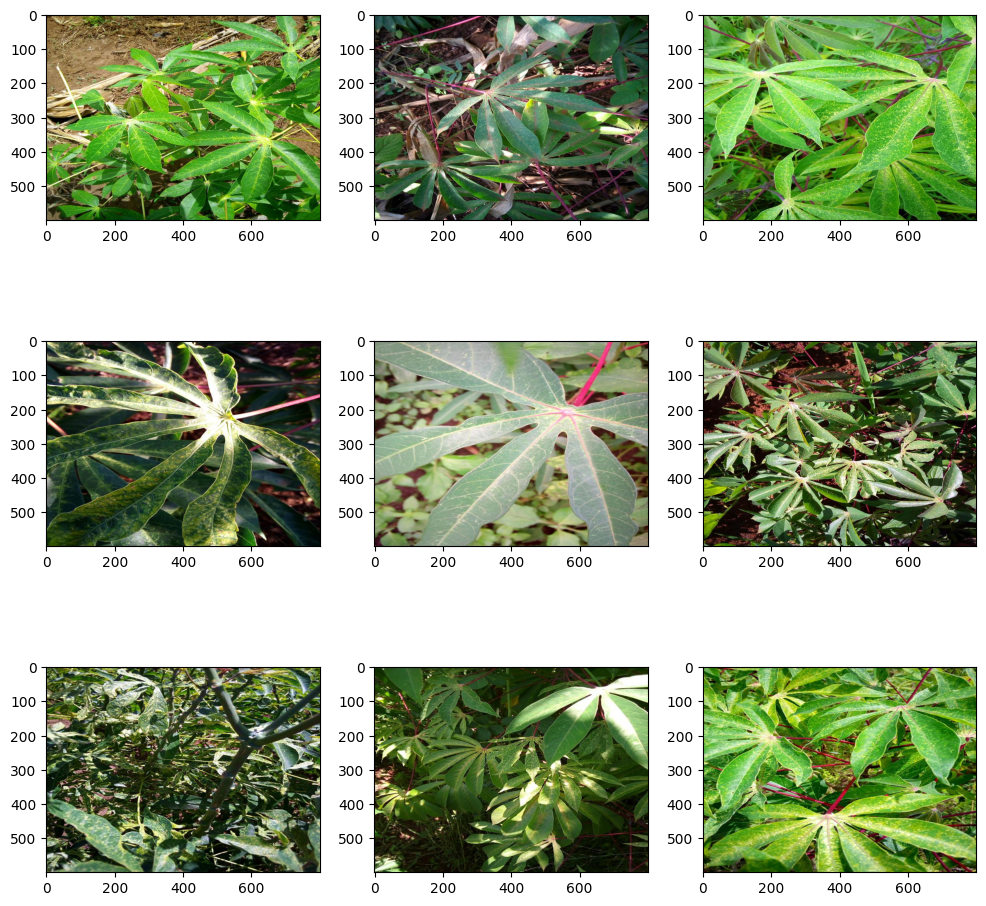

In [147]:
#"2": "Cassava Green Mottle (CGM)"

sample = train_df[train_df.label == 2].sample(9)
plt.figure(figsize=(12,12))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(3, 3, ind + 1)
    image = cv2.imread(os.path.join("cassava-leaf-disease-classification/train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("on")
    
plt.show()

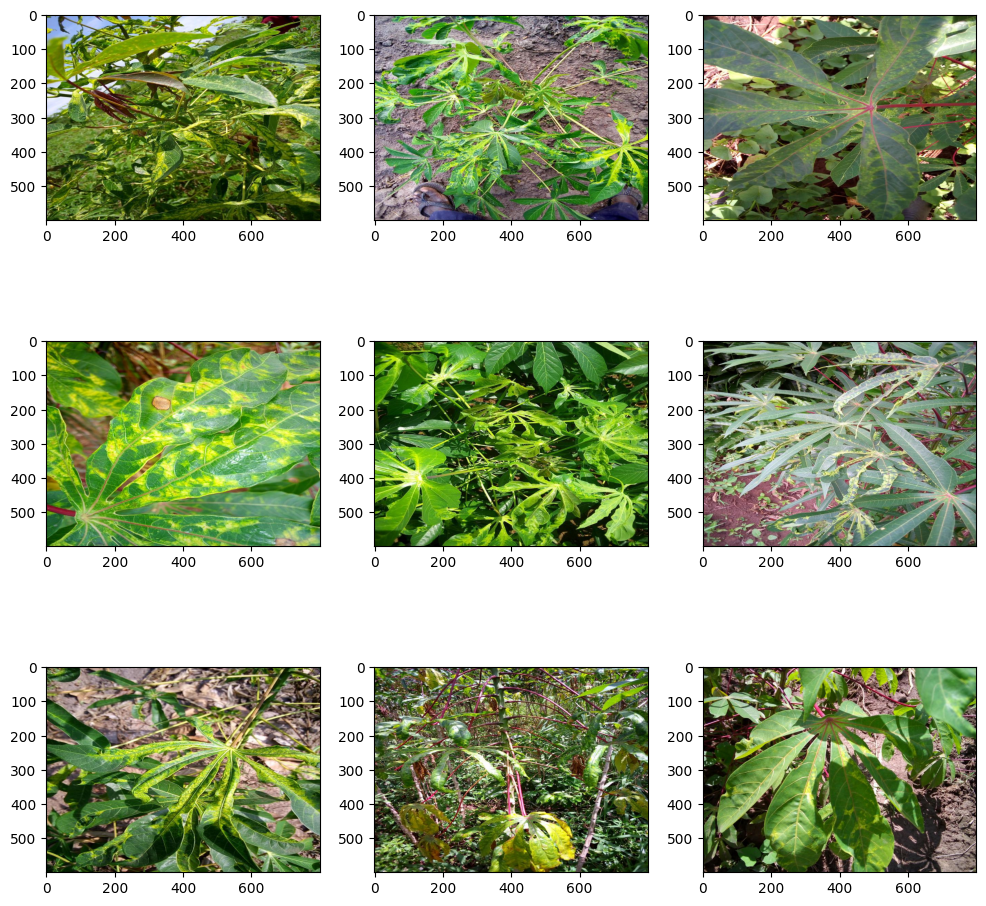

In [148]:
#"3": "Cassava Mosaic Disease (CMD)"

sample = train_df[train_df.label == 3].sample(9)
plt.figure(figsize=(12,12))
for ind, (img_id, lab) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(3,3,ind+1)
    image = cv2.imread(os.path.join("cassava-leaf-disease-classification/train_images", img_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("on")
plt.show()

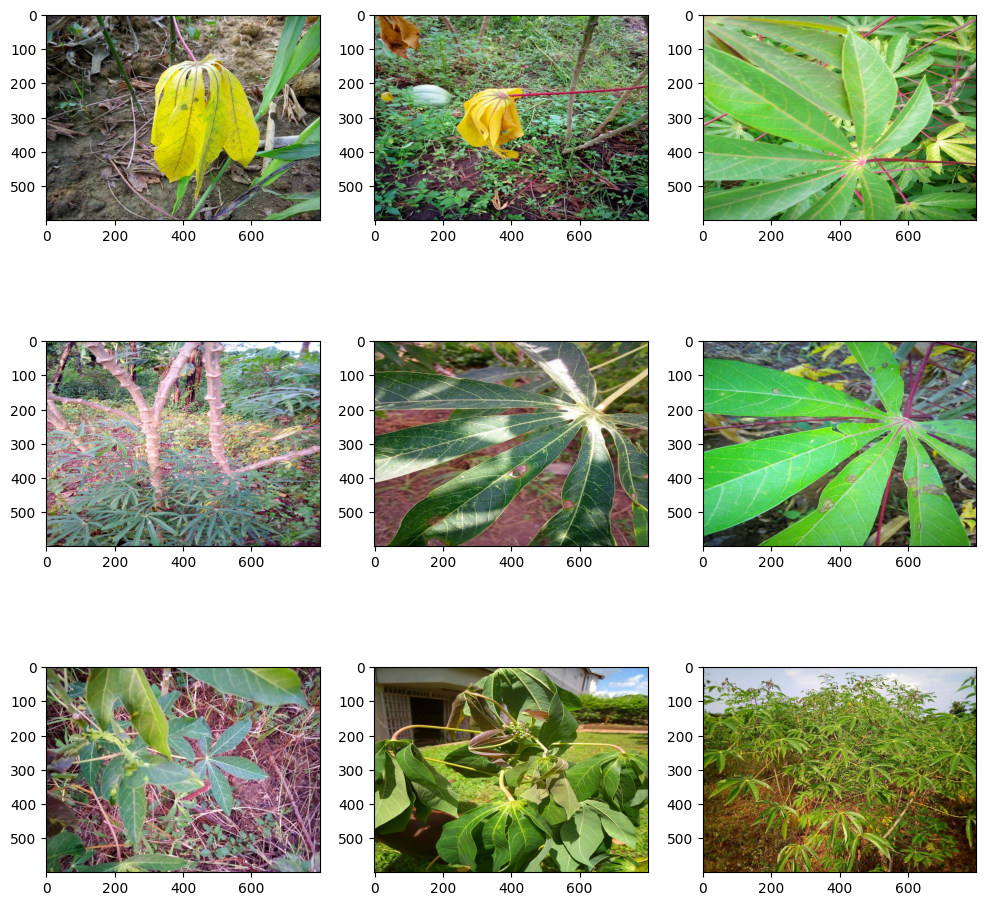

In [149]:
#"4": "Healty"

sample = train_df[train_df.label == 4].sample(9)
plt.figure(figsize=(12,12))
for ind, (img_id, lab) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(3,3,ind+1)
    image = cv2.imread(os.path.join("cassava-leaf-disease-classification/train_images", img_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("on")
plt.show()

In [150]:
y_pred = [3] * len(train_df.label)
print("The baseline accuracy is {}".format(accuracy_score(y_pred, train_df.label)))

The baseline accuracy is 0.6149460204701593


Secara sederhana, jika sekitar 61% daun hanya termasuk dalam kategori 3 dari semua kategori yang ada, itu berarti bahwa sebagian besar daun termasuk dalam kategori 3 tersebut. Ini menunjukkan bahwa kategori 3 ini mungkin yang paling umum atau paling banyak ditemukan di antara daun-daun yang diteliti.


# <p style="color:#f90c0c;text-align:center;font-family:rockwell;font-weight: bold;font-size:120%"> Evaluating Models </p>




In [151]:
# Ini menentukan jumlah sampel yang akan diproses sebelum model memperbarui bobotnya. Dalam hal ini, 16 gambar akan diproses dalam satu batch.
Batch_size = 16

# Menentukan ukuran gambar yang akan digunakan dalam model.
img_height, img_width = 300, 300

In [152]:
train_df['label'].dtype

dtype('int64')


# <p style="color:#f90c0c;text-align:center;font-family:rockwell;font-weight: bold;font-size:120%"> Data Augmentation </p>



In [153]:
train_df['label'] = train_df['label'].astype('str')
gen = ImageDataGenerator(
    horizontal_flip = True,
    vertical_flip = True,
    validation_split = 0.2,
)

train_datagen = gen.flow_from_dataframe(
    train_df,
    directory = os.path.join(Dir, "train_images"),
    batch_size = Batch_size,
    target_size = (img_height, img_width),
    subset = "training",
    seed = 42,
    x_col = "image_id",
    y_col = "label",
    class_mode = "categorical"
)

Found 17118 validated image filenames belonging to 5 classes.


In [154]:
val_gen = ImageDataGenerator(
    validation_split = 0.2
)

val_datagen = val_gen.flow_from_dataframe(
    train_df,
    directory = os.path.join(Dir, "train_images"),
    batch_size = Batch_size,
    target_size = (img_height, img_width),
    subset = "validation",
    seed = 42,
    x_col = "image_id",
    y_col = "label",
    class_mode = "categorical"
)

Found 4279 validated image filenames belonging to 5 classes.


Terdapat 4.279 dataset validation images.

In [155]:
len(train_datagen), len(val_datagen)

(1070, 268)

Saat training model dengan 21.397 gambar, kami membaginya menjadi set training dan validation.

## Untuk set training:
- 80% gambar (21.397 * 0,8)
- Membaginya dengan ukuran batch (16)
- Hasil: Panjang batch pelatihan adalah 1070, yang berarti model memproses 1070 batch yang masing-masing berisi 16 gambar.

## Untuk set validasi:
- 20% gambar (21.397 * 0,2)
- Membaginya dengan ukuran batch (16)
- Hasil: Panjang batch validasi adalah 268, yang berarti model memproses 268 batch yang masing-masing berisi 16 gambar.

---

In [156]:
img, label = next(train_datagen)
label

array([[0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0.]], dtype=float32)

In [157]:
Steps_per_train = float(train_datagen.n) / train_datagen.batch_size
Steps_per_val = float(val_datagen.n) / val_datagen.batch_size
Steps_per_train, Steps_per_val

(1069.875, 267.4375)



# <p style="color:#f90c0c;text-align:center;font-family:rockwell;font-weight: bold;font-size:120%"> Build Model </p>





In [158]:
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam

def create_mobilenetv3_model():
    model = Sequential()
    model.add(MobileNetV3Small(include_top=False, weights='imagenet', input_shape=(img_height, img_width, 3)))
    model.add(GlobalAveragePooling2D())
    model.add(Flatten())
    model.add(Dense(256, activation="relu"))
    model.add(Dropout(0.3))
    model.add(Dense(5, activation='softmax'))
    
    loss = tf.keras.losses.CategoricalCrossentropy(
        label_smoothing=0.0001,
        name='categorical_crossentropy'
    )
    optimizer = Adam(learning_rate=1e-4)
    
    model.compile(optimizer=optimizer,
                  loss=loss,
                  metrics=["categorical_accuracy"])
    return model

mobilenetv3_model = create_mobilenetv3_model()
mobilenetv3_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ MobileNetV3Small (Functional)   │ (None, 10, 10, 576)    │       939,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 576)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 576)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       147,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,088,117 (4.15 MB)

 Trainable params: 1,076,005 (4.10 MB)

 Non-trainable params: 12,112 (47.31 KB)

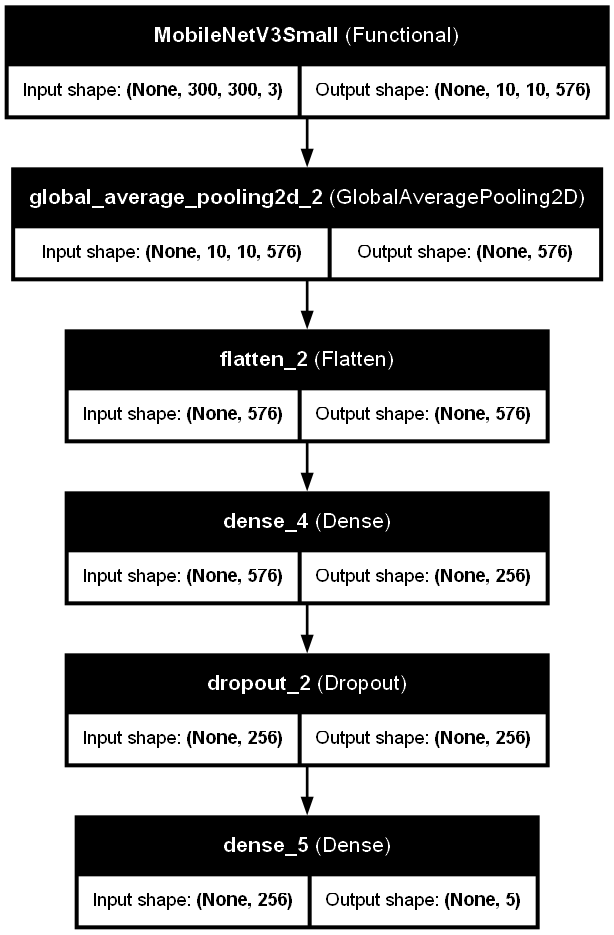

In [159]:
from tensorflow.keras.utils import plot_model

# Plot the model with limited size
plot_model(mobilenetv3_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True, dpi=96)

In [6]:
# Memeriksa apakah GPU tersedia
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("GPU tersedia:", gpus)
else:
    print("GPU tidak tersedia, menggunakan CPU.")

GPU tidak tersedia, menggunakan CPU.


In [160]:
# Memeriksa apakah GPU tersedia
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("GPU tersedia:", gpus)
else:
    print("GPU tidak tersedia, menggunakan CPU.")

# Mendefinisikan callback ReduceLROnPlateau untuk mengurangi learning rate ketika tidak ada perbaikan pada 'val_loss'.
rlronp = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss",
                                              factor=0.2,
                                              mode="min",
                                              min_lr=1e-6,
                                              patience=2, 
                                              verbose=1)

# Mendefinisikan callback EarlyStopping untuk menghentikan pelatihan jika 'val_loss' tidak membaik.
estop = tf.keras.callbacks.EarlyStopping(monitor="val_loss", 
                                         mode="min",
                                         patience=3, 
                                         verbose=1,
                                         restore_best_weights=True)

# Melatih model menggunakan data pelatihan dan validasi.
history = mobilenetv3_model.fit(
    train_datagen,
    steps_per_epoch=int(Steps_per_train),
    epochs=9,
    verbose=1,
    validation_data=val_datagen,
    validation_steps=int(Steps_per_val),
    callbacks=[rlronp, estop]
)

GPU tidak tersedia, menggunakan CPU.
Epoch 1/9
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 1008s 918ms/step - categorical_accuracy: 0.6724 - loss: 0.8964 - val_categorical_accuracy: 0.7320 - val_loss: 0.8083 - learning_rate: 1.0000e-04
Epoch 2/9
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 56s 51ms/step - categorical_accuracy: 0.9375 - loss: 0.3571 - val_categorical_accuracy: 0.7322 - val_loss: 0.8102 - learning_rate: 1.0000e-04
Epoch 3/9
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 861s 805ms/step - categorical_accuracy: 0.7909 - loss: 0.5804 - val_categorical_accuracy: 0.8130 - val_loss: 0.5324 - learning_rate: 1.0000e-04
Epoch 4/9
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - categorical_accuracy: 0.6250 - loss: 0.8793 - val_categorical_accuracy: 0.8125 - val_loss: 0.5327 - learning_rate: 1.0000e-04
Epoch 5/9
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 855s 800ms/step - categorical_accuracy: 0.8232 - loss: 0.5084 - val_categorical_accuracy: 0.8277 - val_loss: 0.4960 - learning_rate: 1.0000e-04
Epoch 6/9
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 

In [161]:
# Save the trained model in Keras format
mobilenetv3_model.save("Cassava_Leaf_Disease_Classification_Model.keras")

In [162]:
# Save the trained model to a file
mobilenetv3_model.save("Cassava_Leaf_Disease_Classification_Model.h5")

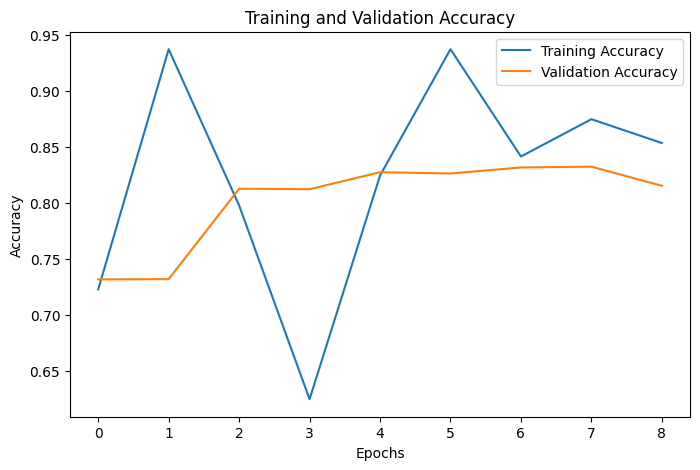

In [163]:
# Plotting training and validation accuracy
plt.figure(figsize=(8, 5))
plt.plot(history.history['categorical_accuracy'], label='Training Accuracy')
plt.plot(history.history['val_categorical_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


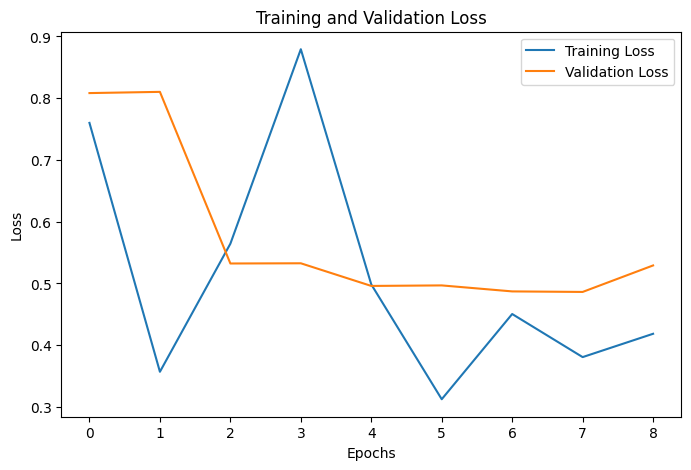

In [164]:
# Plotting training and validation loss
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


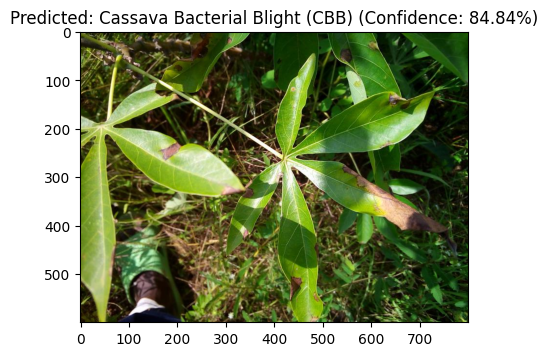

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


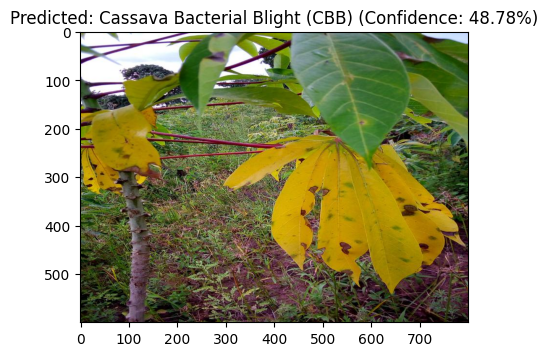

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


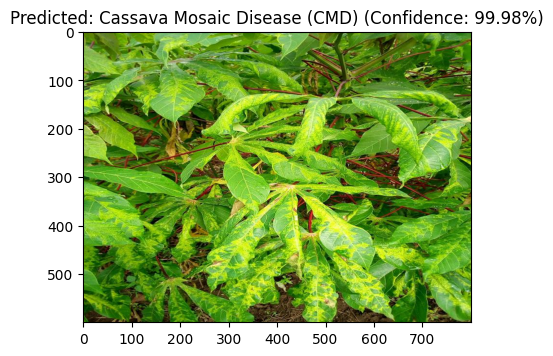

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


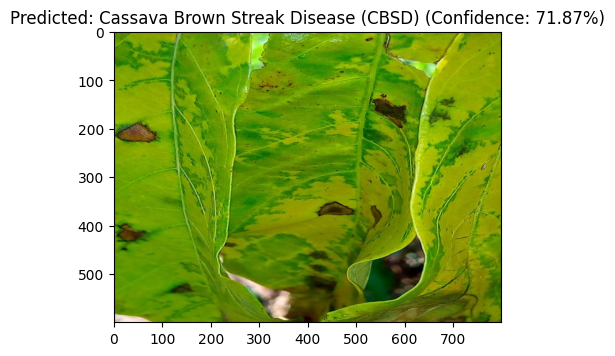

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


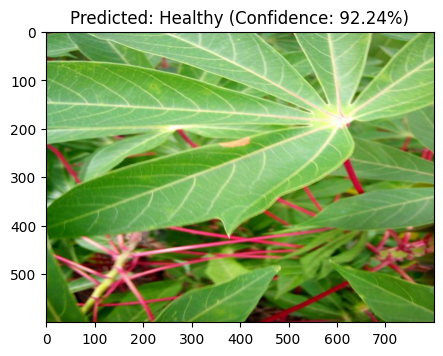

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


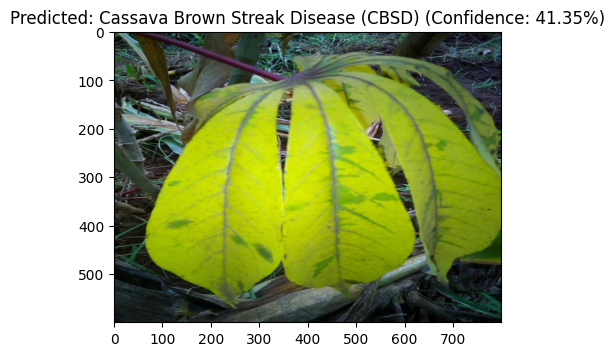

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


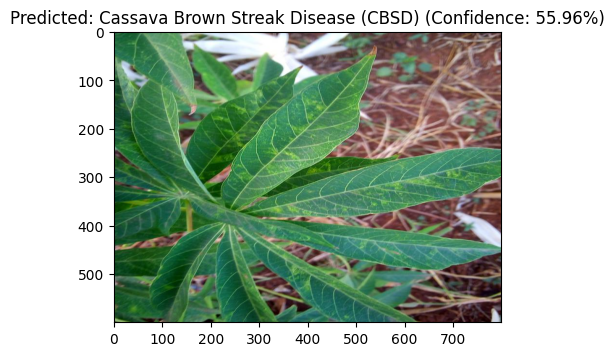

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


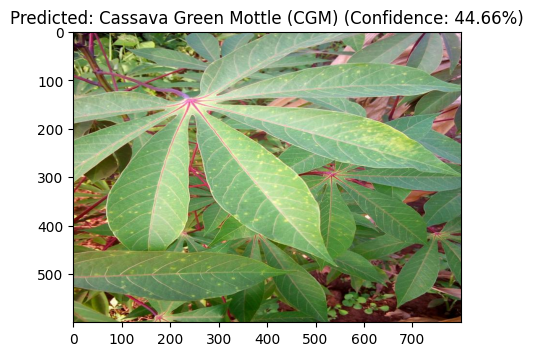

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


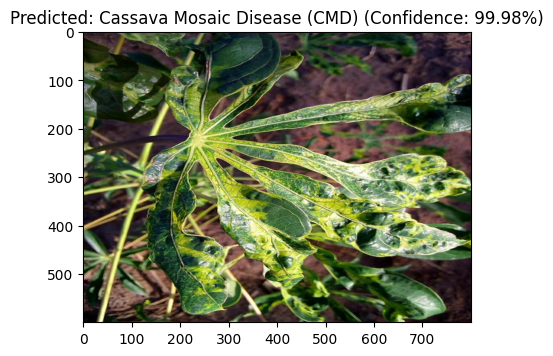

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


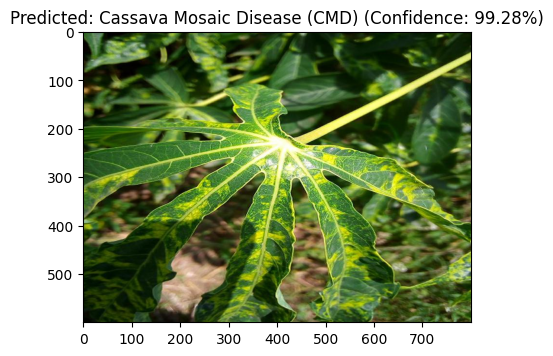

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


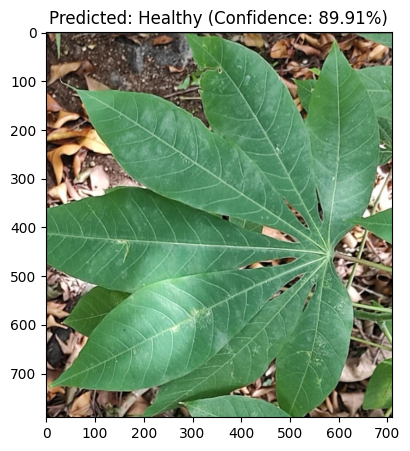

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


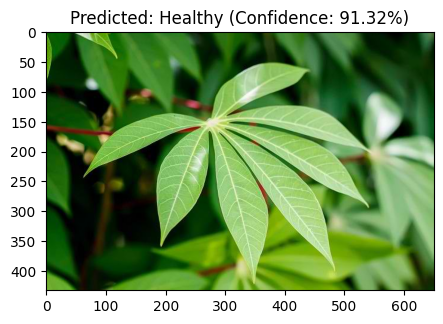

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input, decode_predictions
import matplotlib.pyplot as plt
import numpy as np
import os

# Path ke model yang telah dilatih
model_path = 'Cassava_Leaf_Disease_Classification_Model.keras'

# Load model yang telah dilatih
model = tf.keras.models.load_model(model_path)

# Keterangan label
labels = {
    "0": "Cassava Bacterial Blight (CBB)",
    "1": "Cassava Brown Streak Disease (CBSD)",
    "2": "Cassava Green Mottle (CGM)",
    "3": "Cassava Mosaic Disease (CMD)",
    "4": "Healthy"
}

# Fungsi untuk memuat dan memproses gambar
def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(300, 300))  # Ukuran sesuai dengan input model
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Tambahkan dimensi batch
    img_array = preprocess_input(img_array)  # Pra-pemrosesan sesuai dengan MobileNetV3
    return img_array

# Fungsi untuk melakukan prediksi
def predict_image(img_path):
    img_array = load_and_preprocess_image(img_path)
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions, axis=1)[0]
    return predicted_class, predictions

# Path ke direktori gambar untuk pengujian
test_image_dir = 'cassava-leaf-disease-classification/test_images'  # Ganti dengan path yang sesuai

# Membaca dan menguji gambar
for img_file in os.listdir(test_image_dir):
    img_path = os.path.join(test_image_dir, img_file)
    predicted_class, predictions = predict_image(img_path)
    
    # Menampilkan hasil
    plt.figure(figsize=(5, 5))
    plt.imshow(image.load_img(img_path))
    plt.title(f"Predicted: {labels[str(predicted_class)]} (Confidence: {np.max(predictions) * 100:.2f}%)")
    plt.axis('on')
    plt.show()


268/268 ━━━━━━━━━━━━━━━━━━━━ 56s 208ms/step


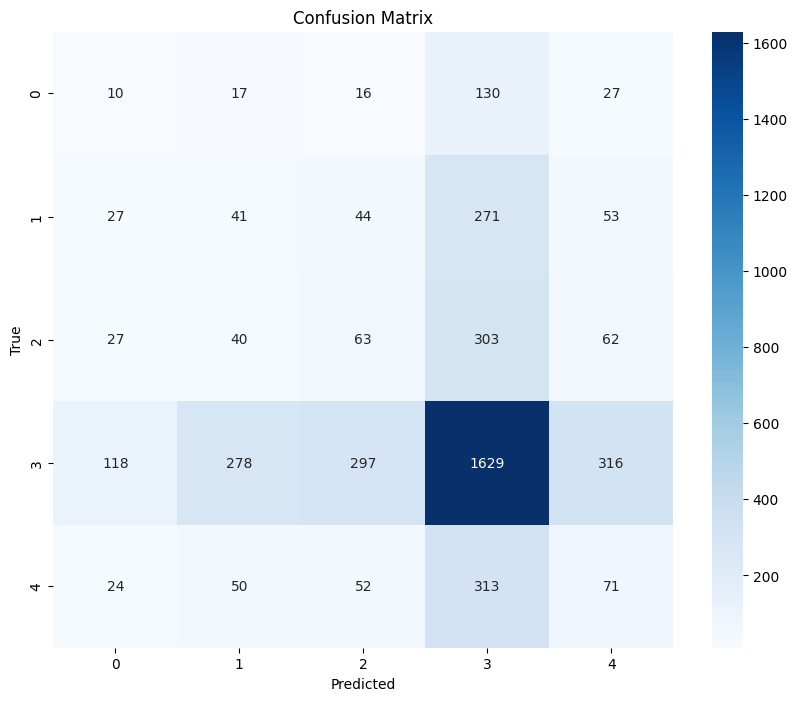

In [180]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate predictions for the validation set
val_predictions = mobilenetv3_model.predict(val_datagen, steps=val_datagen.samples // val_datagen.batch_size + 1)
val_pred_classes = np.argmax(val_predictions, axis=1)

# Get the true labels from the validation set
val_true_classes = val_datagen.classes[:len(val_pred_classes)]

# Create the confusion matrix
cm = confusion_matrix(val_true_classes, val_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [3]:
import tensorflow as tf
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 18207271710698262076
xla_global_id: -1
]
